In [1]:
import numpy as np
import matplotlib.pyplot as pl

import scvelo as scv
scv.logging.print_version()

Running scvelo 0.1.24 (python 3.7.3) on 2019-10-28 18:40.


In [2]:
scv.settings.set_figure_params('scvelo', dpi_save=200, dpi=80, transparent=True)
scv.settings.plot_prefix = 'scvelo_fig2_'
scv.settings.verbosity = 2

## Data Preparation: Dentate Gyrus 

In [3]:
adata = scv.datasets.dentategyrus()


In [4]:
scv.pp.filter_and_normalize(adata, min_shared_cells=20, n_top_genes=2000)
scv.pp.moments(adata, n_neighbors=30, n_pcs=30)

Filtered out 11835 genes that are detected in less than 20 cells (shared).
Normalized count data: X, spliced, unspliced.
Logarithmized X.
computing neighbors
    finished (0:00:04)
computing moments based on connectivities
    finished (0:00:00)


## Velocity Analysis

In [5]:
scv.tl.velocity(adata, vkey='steady_state_velocity', mode='steady_state')
scv.tl.velocity_graph(adata, vkey='steady_state_velocity')

scv.tl.velocity(adata, vkey='stochastic_velocity', mode='stochastic')
scv.tl.velocity_graph(adata, vkey='stochastic_velocity')

computing velocities
    finished (0:00:00)
computing velocity graph
    finished (0:00:02)
computing velocities
    finished (0:00:00)
computing velocity graph
    finished (0:00:04)


In [6]:
scv.tl.recover_dynamics(adata)

In [7]:
# adata.write('data/DentateGyrus/Fig2_DG.h5ad', compression='gzip')
# adata = scv.read('data/DentateGyrus/Fig2_DG.h5ad')

In [8]:
scv.tl.velocity(adata, mode='dynamical', vkey='dynamical_velocity')
scv.tl.velocity_graph(adata, vkey='dynamical_velocity', variance_stabilization=True)

computing velocities
    finished (0:00:02)
computing velocity graph
    finished (0:00:08)


computing velocity embedding
    finished (0:00:00)


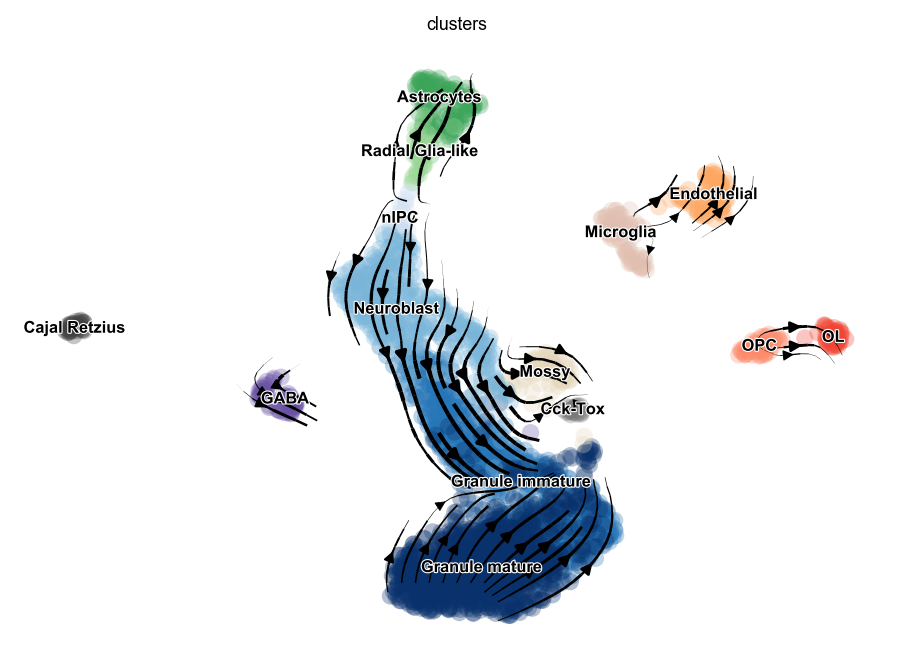

In [9]:
scv.pl.velocity_embedding_stream(adata, vkey='dynamical_velocity')

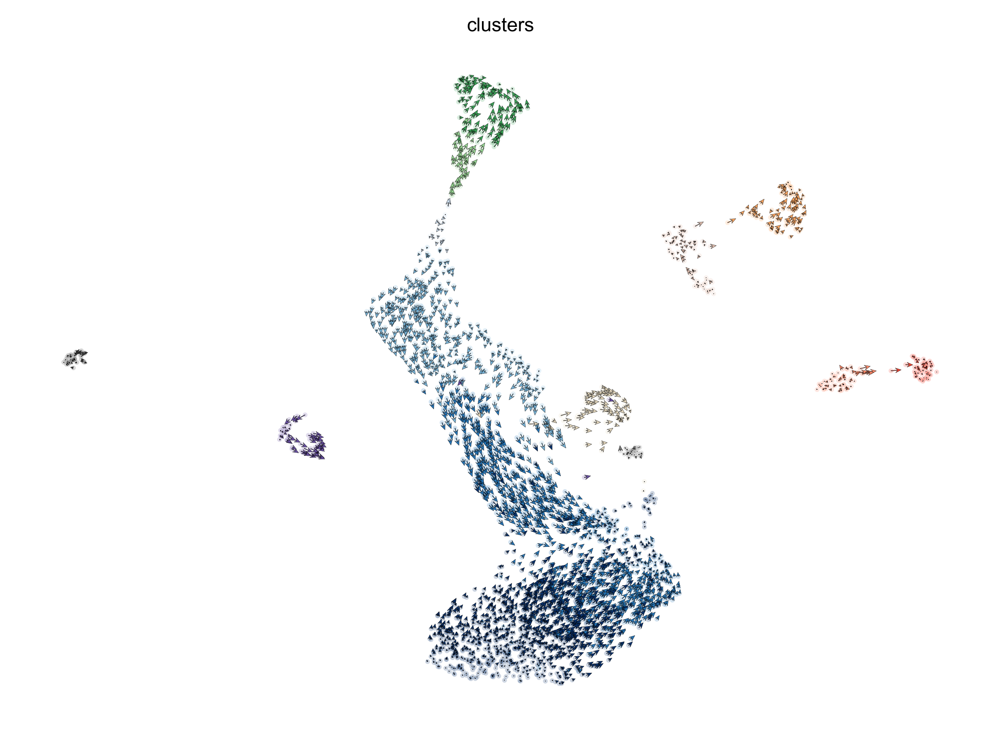

In [13]:
scv.pl.velocity_embedding(adata, vkey='dynamical_velocity', scale=.7, dpi=200)

## Velocyto

In [11]:
vlm = scv.utils.convert_to_loom(scv.datasets.dentategyrus())

vlm.score_detection_levels(min_expr_counts=20, min_expr_counts_U=20)
vlm.filter_genes(by_detection_levels=True)

vlm.score_cv_vs_mean(2000)
vlm.filter_genes(by_cv_vs_mean=True)

vlm._normalize_S(relative_size=vlm.initial_cell_size, target_size=np.median(vlm.initial_cell_size))
vlm._normalize_U(relative_size=vlm.initial_Ucell_size, target_size=np.median(vlm.initial_Ucell_size))

vlm.S_norm = np.log1p(vlm.S_sz)

vlm.perform_PCA(n_components=30)
vlm.knn_imputation(n_pca_dims=30, k=30)
vlm.normalize_median()

vlm.fit_gammas(fit_offset=False)
#vlm.filter_genes_good_fit()

vlm.predict_U()
vlm.calculate_velocity()
vlm.calculate_shift()
vlm.extrapolate_cell_at_t()

vlm.estimate_transition_prob(hidim='Sx_sz', emebed='ts', transform='sqrt', )
vlm.calculate_embedding_shift(sigma_corr=.05, expression_scaling=False, )

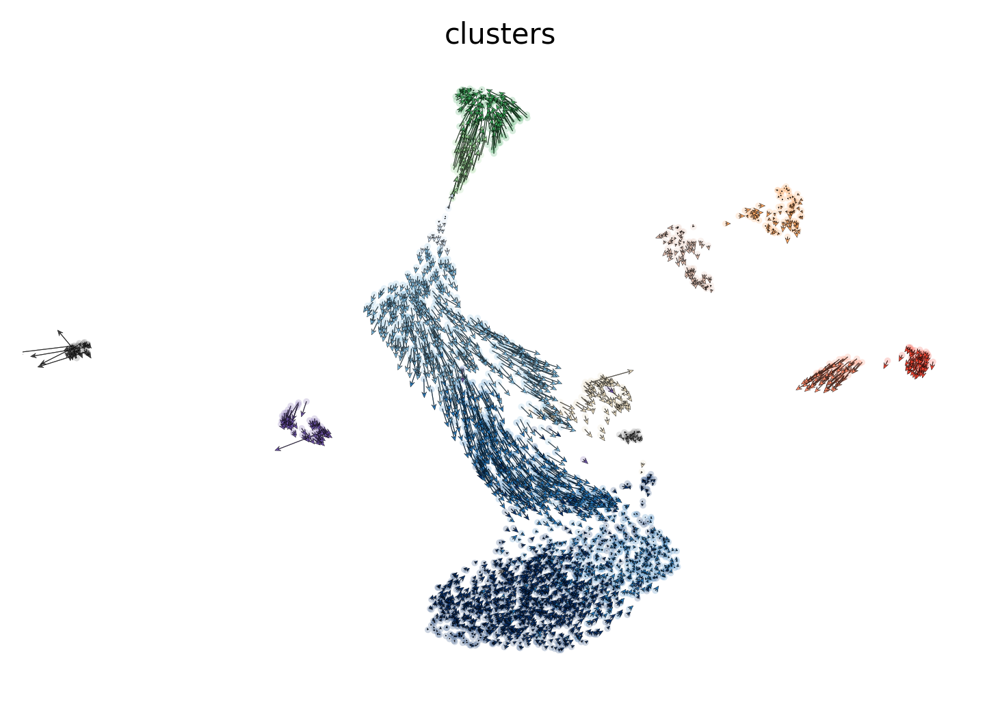

In [12]:
scv.pl.velocity_embedding(adata, X=vlm.embedding, V=vlm.delta_embedding, frameon=False, dpi=300)

## Consistencies of single-cell velocities

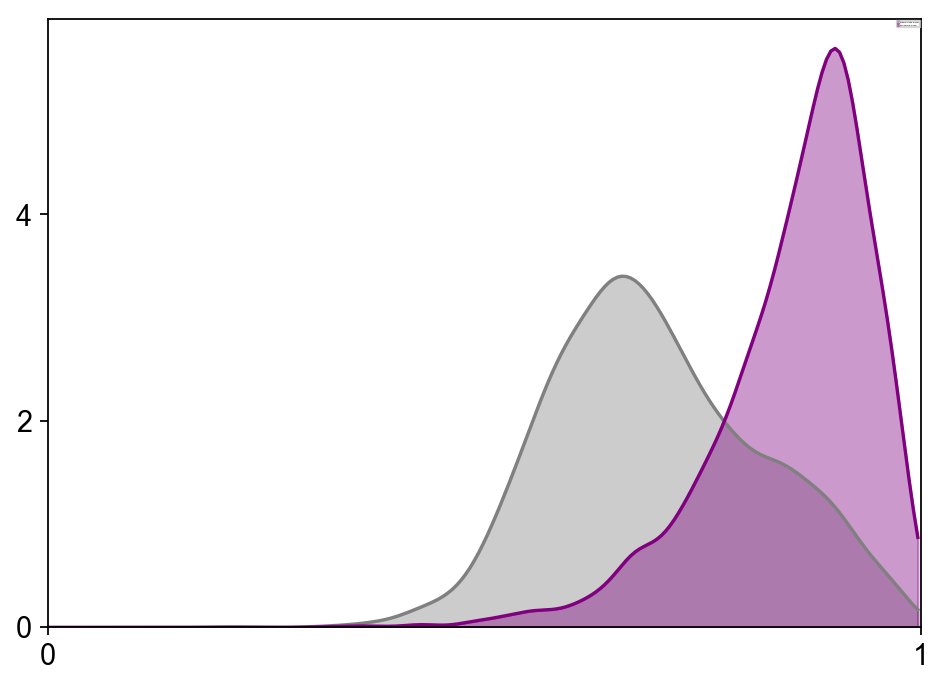

In [11]:
vkey_ss = 'steady_state_velocity'
vkey_sm = 'stochastic_velocity'
vkey_dm = 'dynamical_velocity'

scv.tl.velocity_confidence(adata, vkey=vkey_ss)
scv.tl.velocity_confidence(adata, vkey=vkey_sm)
scv.tl.velocity_confidence(adata, vkey=vkey_dm)

scv.pl.hist([adata.obs[vkey_ss + '_confidence'].values, 
             adata.obs[vkey_dm + '_confidence'].values],
            labels=['steady-state model', 'dynamical model'], kde=True, colors=['grey', 'purple'],
            bins=200, xlim=[0, 1], fontsize=18, legend_fontsize=1)

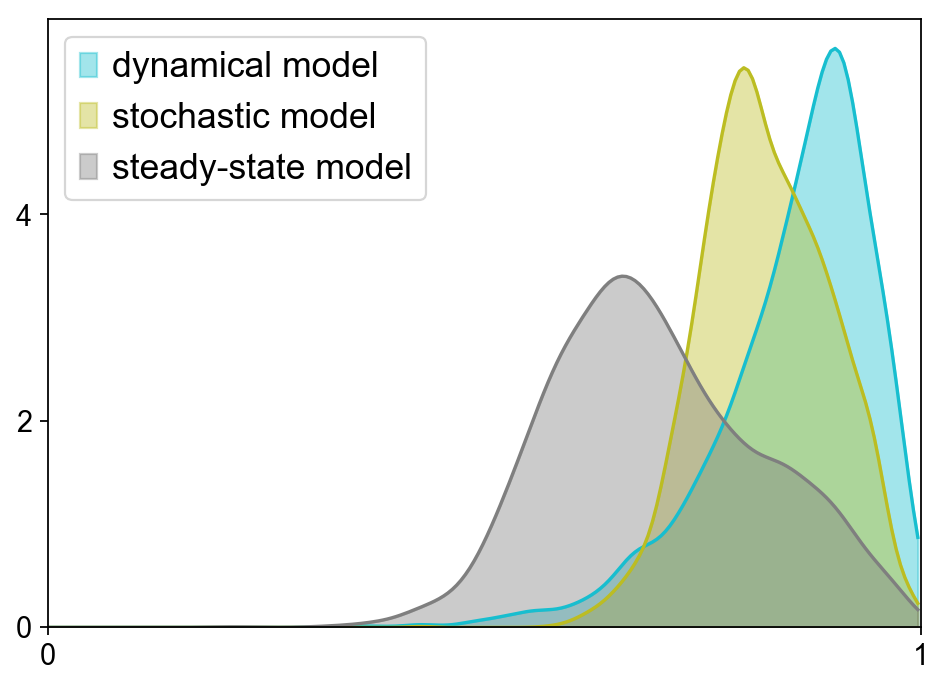

In [12]:
scv.pl.hist([adata.obs[vkey_dm + '_confidence'].values, 
             adata.obs[vkey_sm + '_confidence'].values,
             adata.obs[vkey_ss + '_confidence'].values], 
            labels=['dynamical model', 'stochastic model', 'steady-state model'], kde=True, 
            bins=200, xlim=[0, 1], fontsize=18, legend_fontsize=16)

## Gene velocities

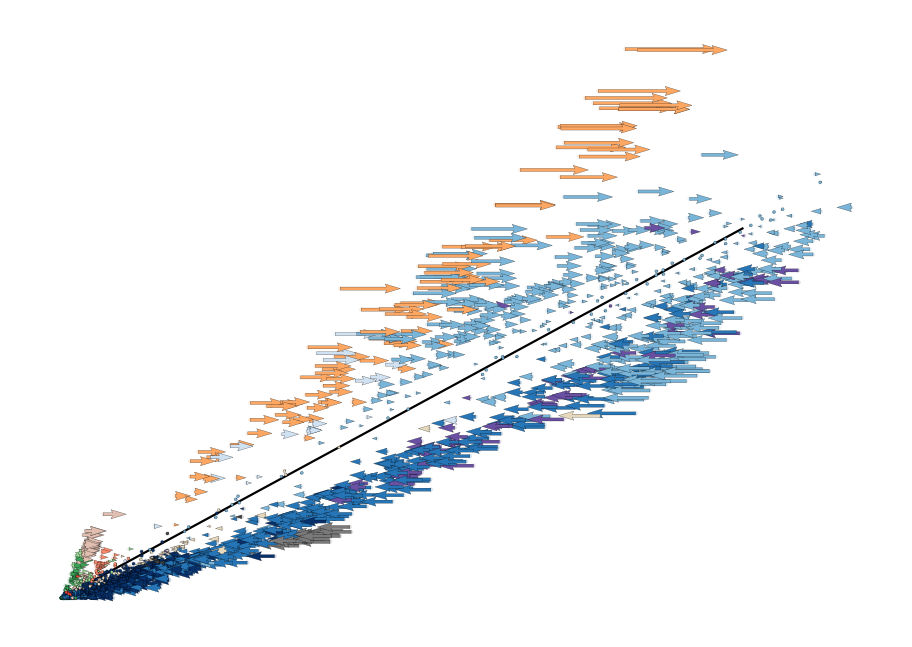

In [13]:
scv.pl.velocity_embedding(adata, vkey='steady_state_velocity', basis='Tmsb10', 
                          scale=.6, width=.0035, frameon=False, title='')

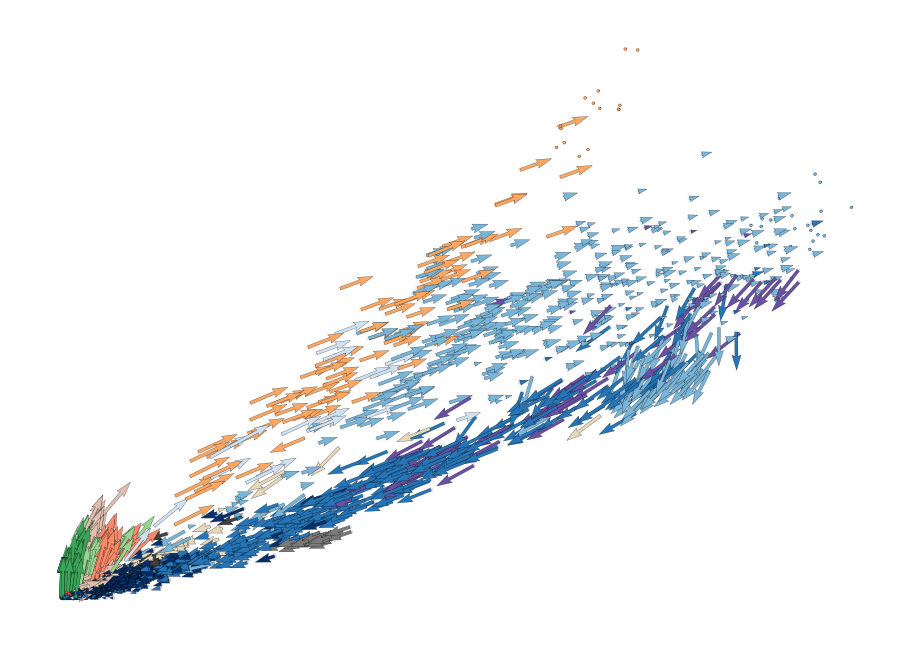

In [14]:
scv.pl.velocity_embedding(adata, vkey='dynamical_velocity', basis='Tmsb10', scale=4, width=.0035,
                         frameon=False, title='')

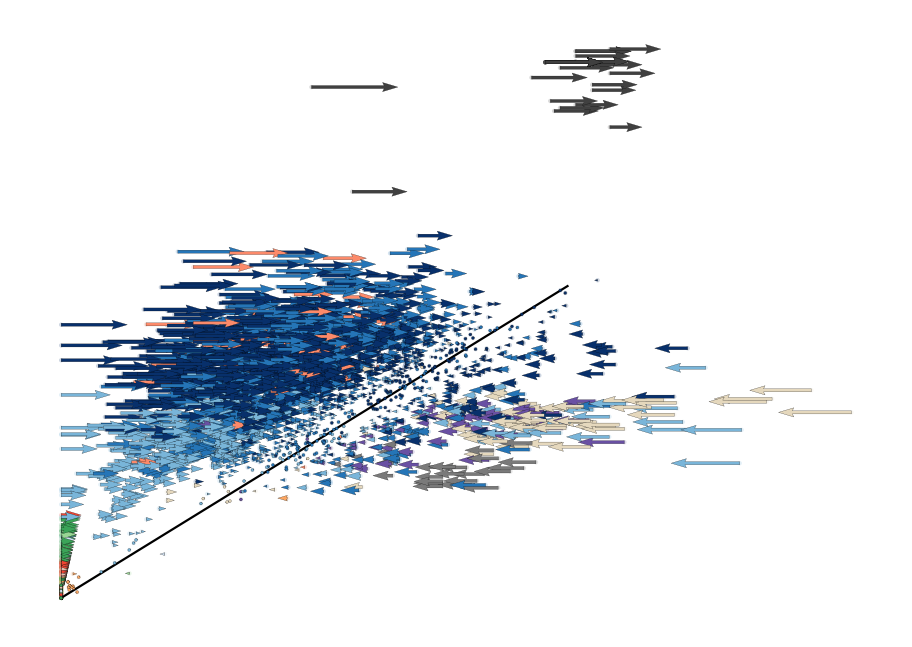

In [15]:
scv.pl.velocity_embedding(adata, vkey='steady_state_velocity', basis='Fam155a', 
                          scale=60, width=.0035, frameon=False, title='')

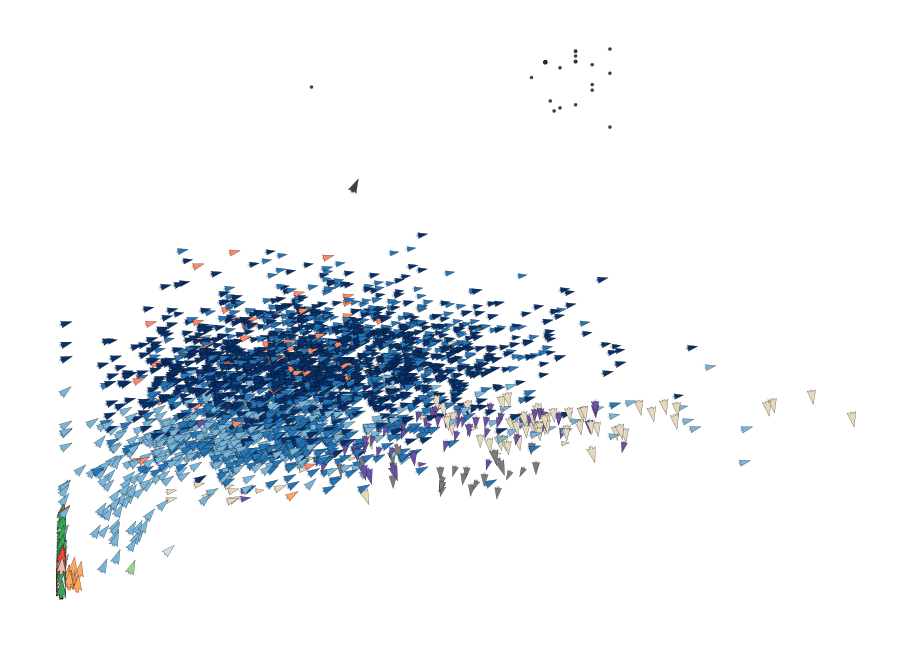

In [17]:
scv.pl.velocity_embedding(adata, vkey='dynamical_velocity', basis='Fam155a', 
                          scale=3, width=.0035, frameon=False, title='')

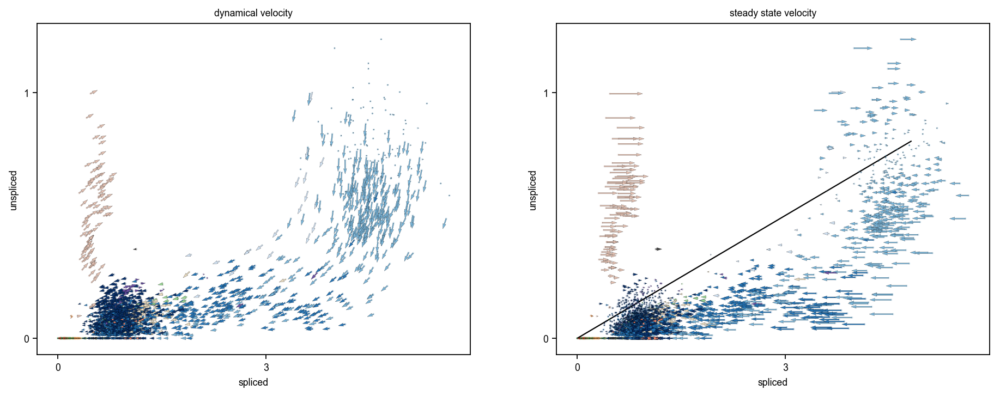

In [18]:
gene = 'Hn1'
scv.pl.velocity_embedding(adata, basis=gene, vkey=['dynamical_velocity', 'steady_state_velocity'])

## Top likelihood-ranked genes

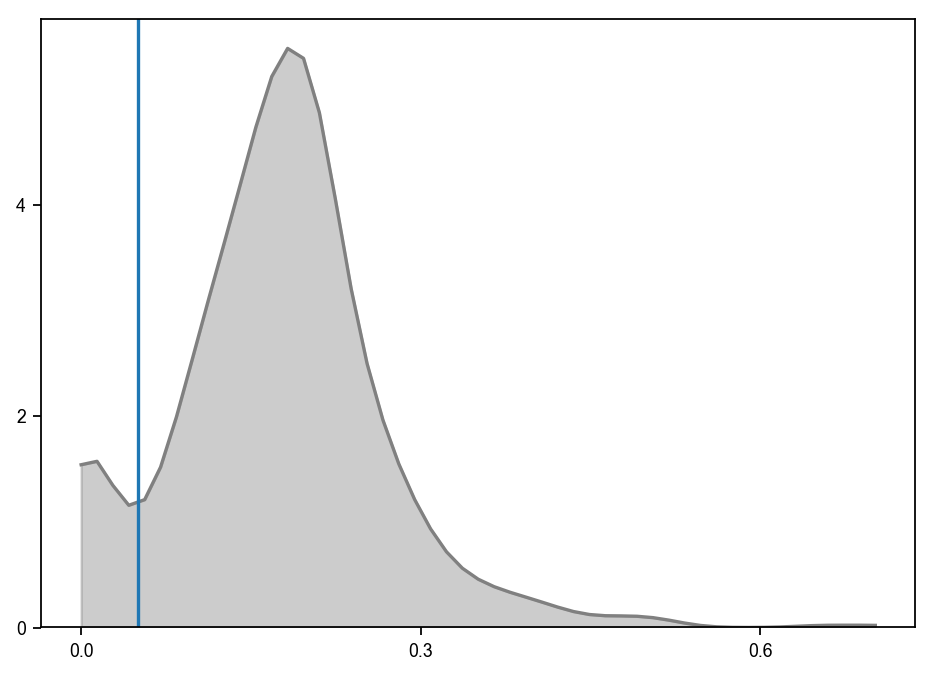

In [19]:
scv.pl.hist(adata.var['fit_likelihood'], axvline=.05, kde=True, exclude_zeros=True, colors=['grey'])

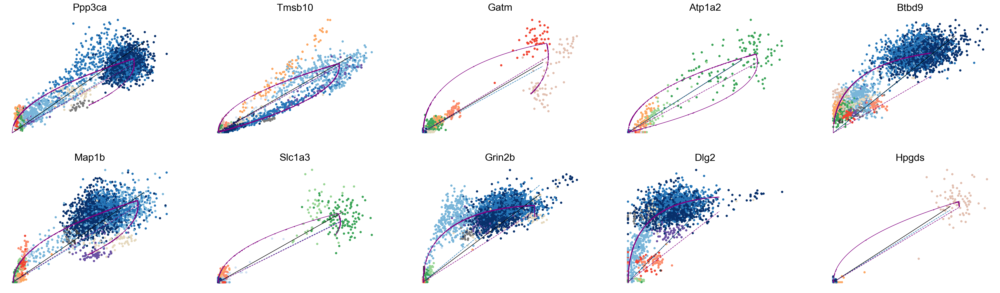

In [20]:
top_genes = adata.var.sort_values('fit_likelihood', ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:10], legend_loc='none', 
               size=80, frameon=False, ncols=5, fontsize=20)

In [319]:
var_names = ['Tmsb10', 'Ppp3ca', 'Hn1', 'Dlg2']
scv.tl.recover_dynamics(adata, var_names=var_names, max_iter=100)

recovering dynamics
    finished (0:00:03)

outputs model fit of gene: Dlg2


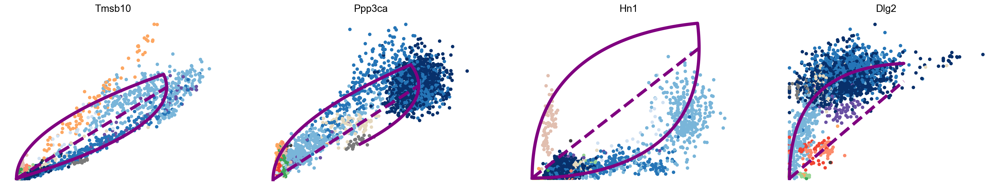

In [320]:
scv.pl.scatter(adata, basis=['Tmsb10', 'Ppp3ca', 'Hn1', 'Dlg2'], vkey='dynamics', 
               linewidth=5, frameon=False, size=120, legend_loc='none', fontsize=16)

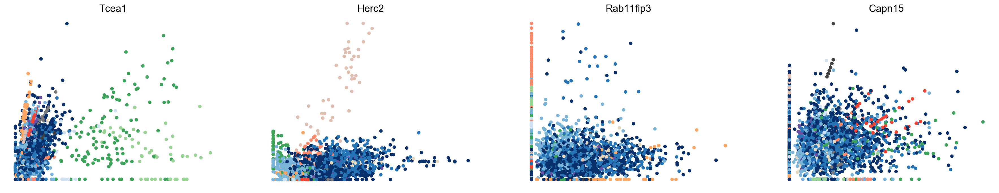

In [275]:
scv.pl.scatter(adata, basis=top_genes[::-1][:4], vkey='dynamics', 
               linewidth=5, frameon=False, size=120, legend_loc='none', fontsize=16)

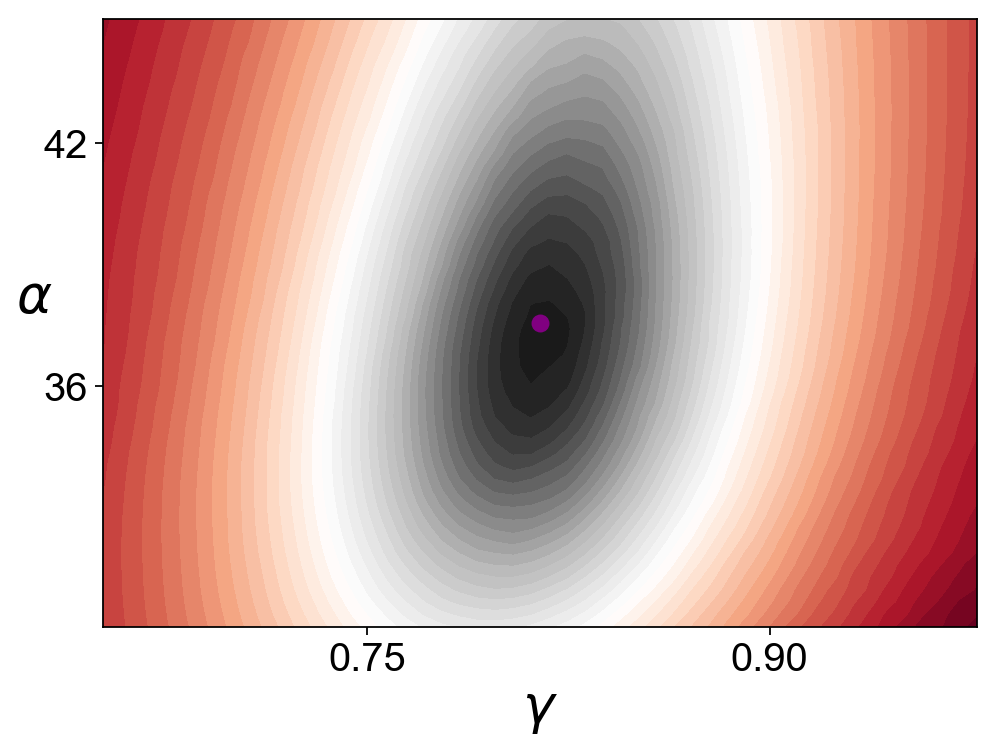

In [344]:
dm = scv.tl.recover_dynamics(adata, var_names='Tmsb10', max_iter=100)
dm.plot_profile_contour(x_sight=.2, y_sight=.2, contour_levels=0, num=50, fontsize=24)

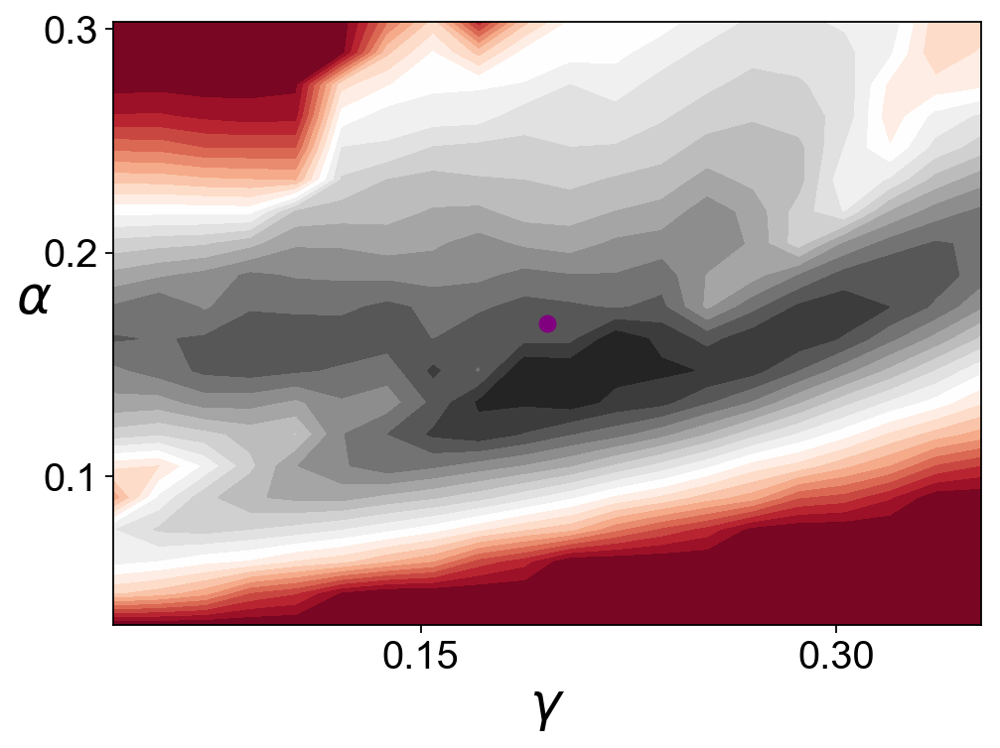

In [336]:
dm = scv.tl.recover_dynamics(adata, var_names='Tcea1', max_iter=10)
dm.plot_profile_contour(x_sight=.8, y_sight=.8, contour_levels=0, num=20, fontsize=24)

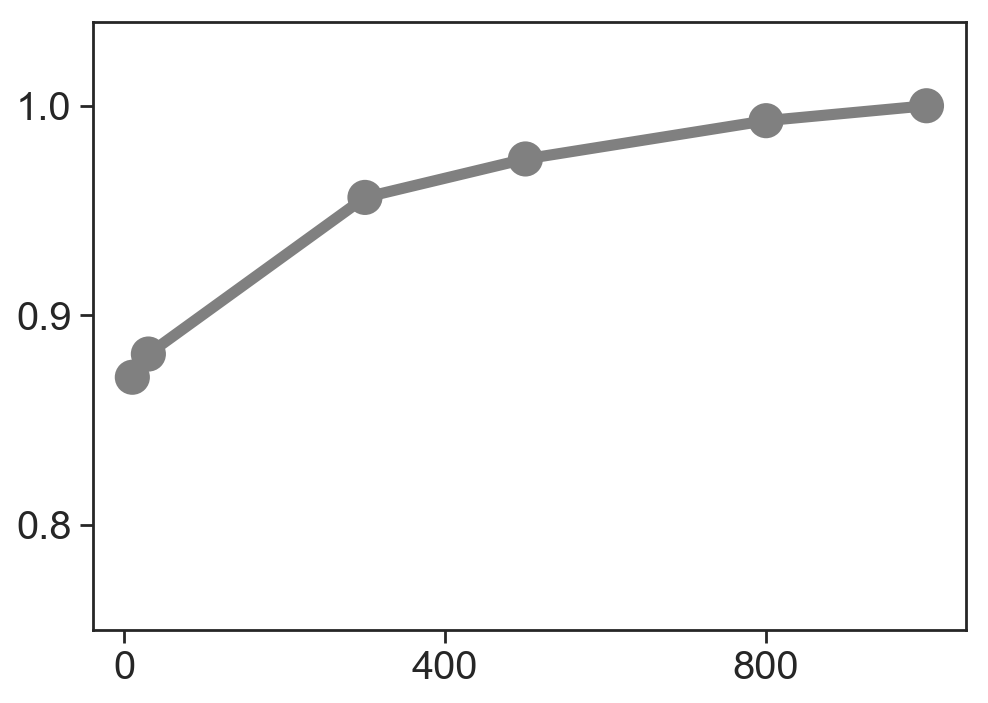

In [218]:
# validation of top likelihood genes

top_genes = adata.var.sort_values('fit_likelihood', ascending=False).index
rnd_genes = np.random.choice(adata.var_names, size=adata.n_vars)
full_graph = adata.uns['dynamical_velocity_graph'].A
adj = full_graph / full_graph > 0
n_genes = np.array([10, 30, 300, 500, 800, 1000])
rhos = []
rhos_med = []
for n in n_genes:
    if n == 0: 
        rhos_med.extend([0])
    else:
        idx = adata.var_names.isin(top_genes[:n])

        vgraph = scv.VelocityGraph(adata[:, idx], vkey='dynamical_velocity') 
        vgraph.compute_cosines()

        rho = scv.utils.vcorrcoef(full_graph * adj, vgraph.graph.A * adj)

        rhos.extend([rho])
        rhos_med.extend([np.nanmedian(rho)])

rhos = np.array(rhos)
rhos_med = np.array(rhos_med)

ax = scv.pl.scatter(x=n_genes, y=rhos_med, size=1000, show=False, ylim=[.75, 1.04], fontsize=24)
ax.plot(n_genes, rhos_med, color='grey', linewidth=5)
#ax.set_yticklabels([.8, .9, .95, 1])

computing velocity graph
    finished (0:00:00)
computing velocity embedding
    finished (0:00:00)


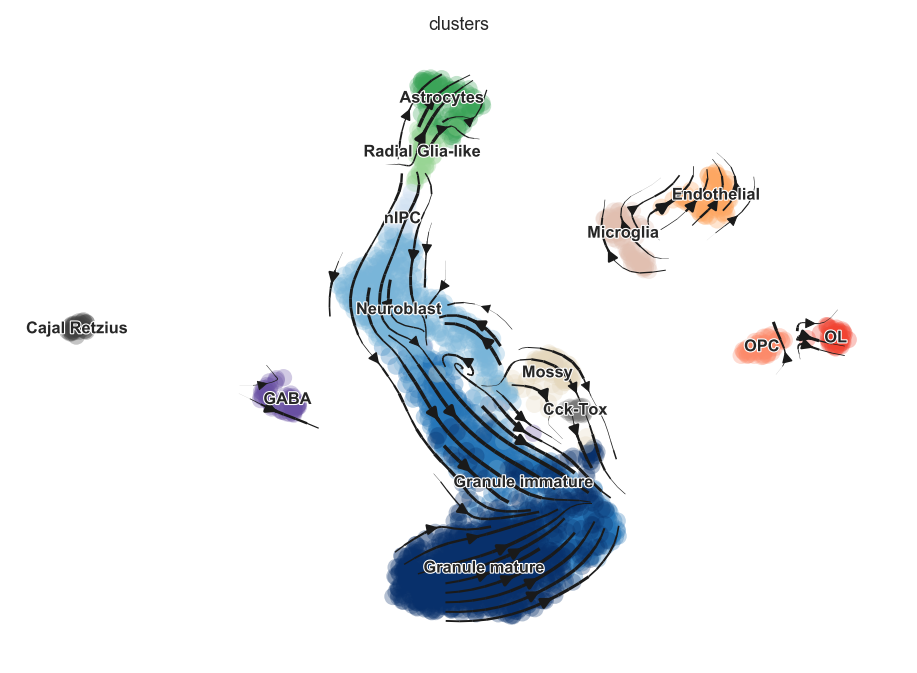

In [296]:
sdata = adata[:, adata.var_names.isin(top_genes[:10])].copy()
scv.tl.velocity_graph(sdata, vkey='dynamical_velocity')
scv.pl.velocity_embedding_stream(sdata, vkey='dynamical_velocity')

computing velocity graph
    finished (0:00:04)
computing velocity embedding
    finished (0:00:00)


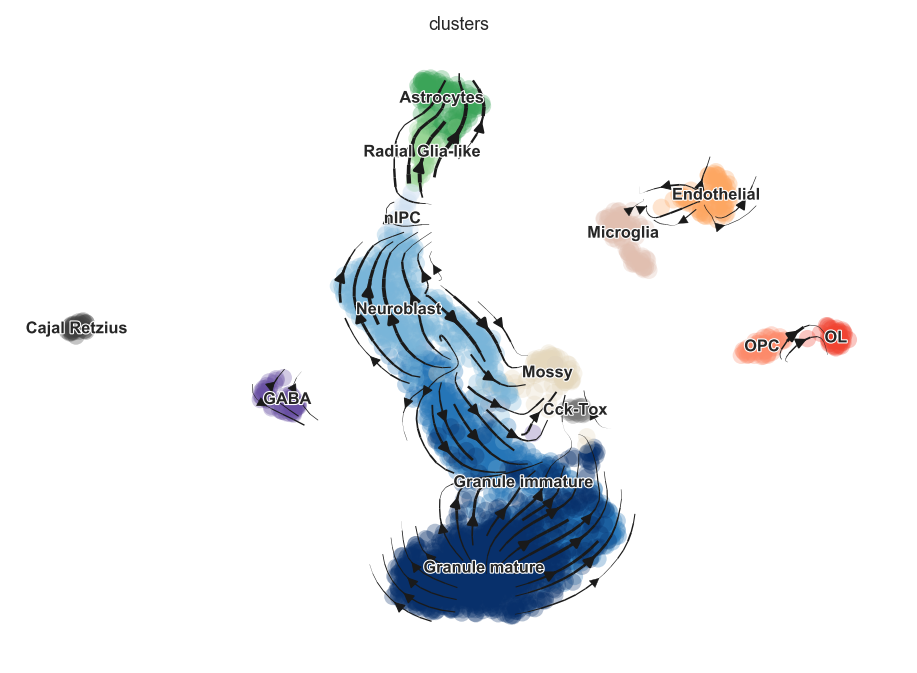

In [295]:
sdata = adata[:, ~adata.var_names.isin(top_genes[:30])].copy()
scv.tl.velocity_graph(sdata, vkey='dynamical_velocity')
scv.pl.velocity_embedding_stream(sdata, vkey='dynamical_velocity')

In [24]:
from gprofiler import GProfiler
gp = GProfiler(return_dataframe=True, user_agent='g:GOSt')

neuro_enrichment = gp.profile(query=list(top_genes[:100]), background=list(adata.var_names),
                              organism='mmusculus', sources=['KEGG'], significance_threshold_method='fdr')

In [25]:
neuro_enrich_results = neuro_enrichment.set_index('native').sort_values('p_value').iloc[:,[2,5,7,10,1]]
neuro_enrich_results.iloc[:100,:]

,p_value,term_size,intersection_size,recall,name
native,,,,,
KEGG:04024,0.018189,48,9,0.187500,cAMP signaling pathway
KEGG:04720,0.018189,30,7,0.233333,Long-term potentiation
KEGG:04724,0.018189,37,8,0.216216,Glutamatergic synapse
KEGG:04080,0.031520,17,5,0.294118,Neuroactive ligand-receptor interaction
KEGG:05014,0.035609,11,4,0.363636,Amyotrophic lateral sclerosis (ALS)
KEGG:04713,0.047459,29,6,0.206897,Circadian entrainment


## Velocity Analysis

computing velocity embedding
    finished (0:00:00)


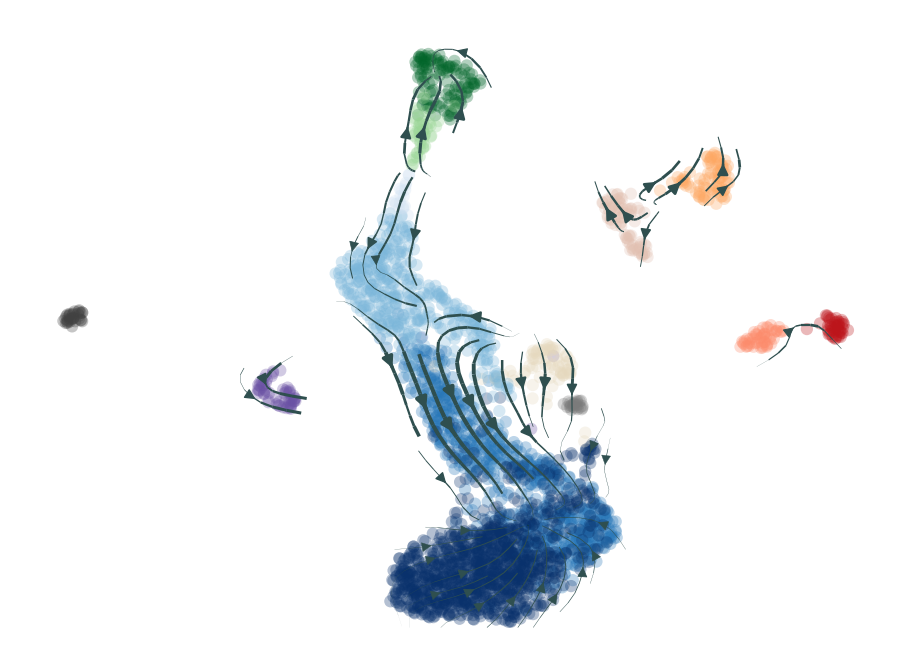

In [7]:
scv.pl.velocity_embedding_stream(adata, vkey='steady_state_velocity', title='', legend_loc='none', 
                                 alpha=.3, legend_fontsize=12, arrow_color='darkslategrey', 
                                 density=.9, linewidth=1, min_mass=2)

In [106]:
kwargs = {'fontsize': 18, 'size': 80, 'title': '', 
          'legend_loc': 'none', 'colorbar': False, 'frameon': False}
basis = 'Tmsb10'

In [21]:
dm = scv.tl.recover_dynamics(adata, var_names='Tmsb10')

recovering dynamics
    finished (0:00:01)

outputs model fit of gene: Tmsb10


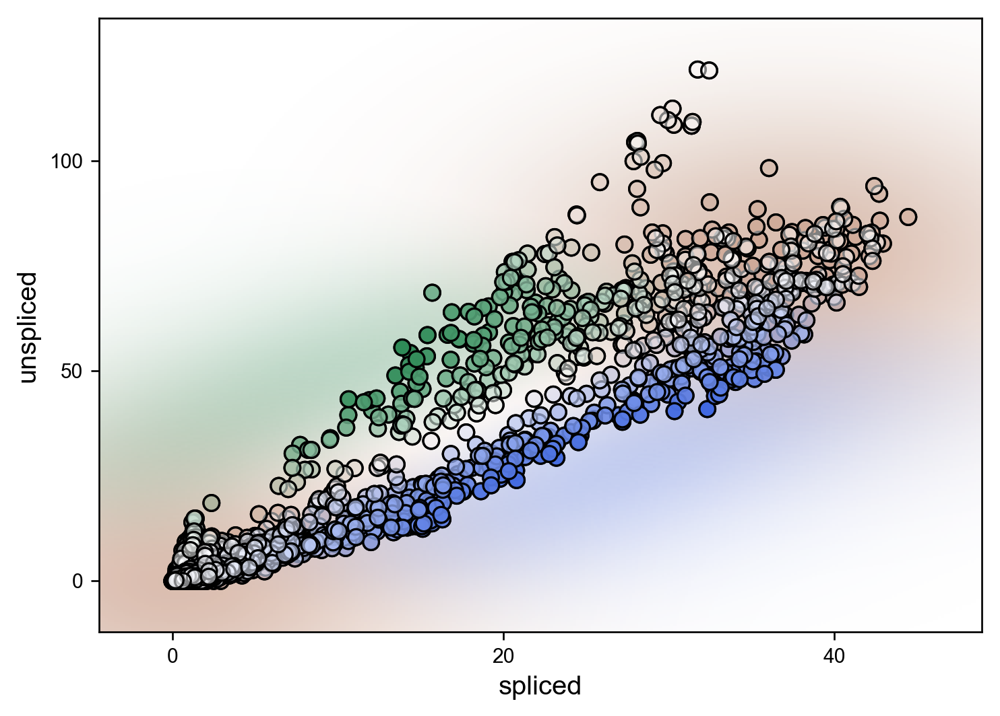

In [30]:
ax = dm.plot_state_likelihoods(var_scale=None, dpi=120)

## Supplementary

In [56]:
scv.tl.recover_dynamics(adata, var_names=var_names)
scv.tl.velocity(adata, mode='dynamical', vkey='dynamical_velocity', mode='soft', normalized=True)

recovering dynamics
    finished (0:00:02)
computing dynamical velocities
    finished (0:00:00)


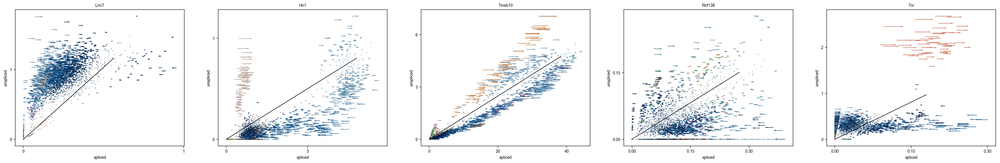

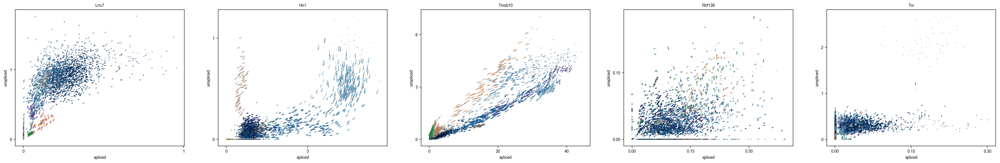

In [35]:
var_names=['Lrrc7', 'Hn1', 'Tmsb10', 'Rnf138', 'Tnr']

scv.pl.velocity_embedding(adata, basis=var_names, vkey='steady_state_velocity')
scv.pl.velocity_embedding(adata, basis=var_names, vkey='dynamical_velocity')

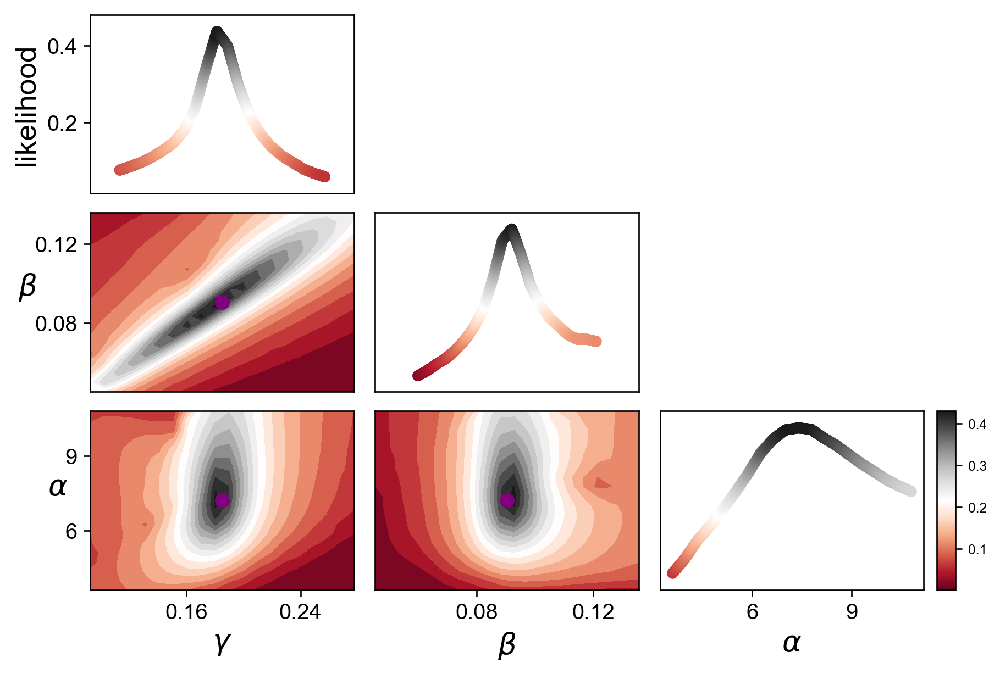

In [88]:
dm = scv.tl.recover_dynamics(adata, var_names='Tmsb10')
dm.plot_profiles(fontsize=16, dpi=120)

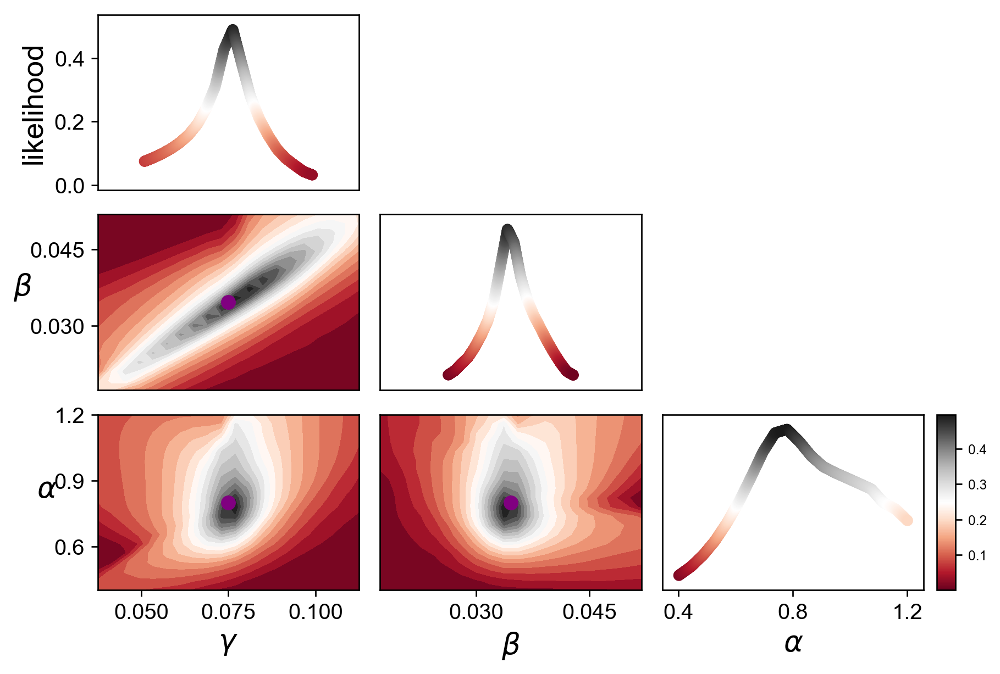

In [90]:
dm = scv.tl.recover_dynamics(adata, var_names='Ppp3ca')
dm.plot_profiles(fontsize=16, dpi=120)